In [1]:
import warnings
warnings.filterwarnings("ignore")

In [2]:
import numpy as np

In [3]:
import numpy as np
import pandas as pd
import igraph as ig
import scanpy as sc
import scanpy.external as sce
from scipy.sparse import csr_matrix, isspmatrix

#Plotting
import matplotlib.pyplot as plt
import seaborn as sns

#ultils
from datetime import datetime

sc.logging.print_header()
sc.settings.verbosity = 3
sc.settings.set_figure_params(dpi=80)

scanpy==1.9.3 anndata==0.9.1 umap==0.5.3 numpy==1.24.4 scipy==1.11.1 pandas==2.0.3 scikit-learn==1.3.0 statsmodels==0.14.0 python-igraph==0.10.4 pynndescent==0.5.10


In [4]:
import sys
sys.path.append('..')

from src.configs import config
from src.utils import visualise as vs
%load_ext autoreload
%autoreload 2
warnings.filterwarnings("once")

## 1.3 Custom Plotting Functions

In [6]:
results_file = str(config.PATHS.DATA/'1_AdataFilt.h5ad')
adata = sc.read(config.PATHS.DATA/'1_AssembledAdata.h5ad')

adata

AnnData object with n_obs × n_vars = 36034 × 23454
    obs: 'timepoint', 'line', '10X_date', 'clusters', 'tSNE_1', 'tSNE_2', 'sample_id', 'run_id', 'cell_label'

In [7]:
adata.X

<36034x23454 sparse matrix of type '<class 'numpy.int64'>'
	with 89179705 stored elements in Compressed Sparse Row format>

In [8]:
print(adata[:10, :2].X)

#so see it more matrix like
adata.X.toarray()[:10, :10]

  (0, 0)	1
  (1, 0)	1
  (5, 0)	1
  (5, 1)	2
  (7, 1)	1


array([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 0, 0, 0, 1, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
       [0, 0, 0, 1, 0, 0, 0, 0, 0, 1],
       [1, 2, 0, 0, 0, 0, 0, 0, 2, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 1, 0, 4, 1, 1],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]])

In [9]:
# To store the values in a new object
ACTB_counts = adata[:,['ACTB']].X
print(ACTB_counts[:10,])
ACTB_counts

  (0, 0)	193
  (1, 0)	14
  (2, 0)	8
  (3, 0)	88
  (4, 0)	37
  (5, 0)	60
  (6, 0)	5
  (7, 0)	14
  (8, 0)	32
  (9, 0)	16


<36034x1 sparse matrix of type '<class 'numpy.int64'>'
	with 35859 stored elements in Compressed Sparse Row format>

# Cell metadata

Adata.obs stores the metadata about the observations: cells (rows of the expression matrix).  

In [10]:
# Check number and names of cells
print('Initial number of cells:', adata.n_obs)
print('Cell names: ', adata.obs_names[:10].tolist())
adata.obs.columns

Initial number of cells: 36034
Cell names:  ['AAACCTGAGACCTAGG-4.d5_409b2_171212', 'AAACCTGAGTCCGTAT-4.d5_409b2_171212', 'AAACCTGGTATCTGCA-4.d5_409b2_171212', 'AAACCTGTCATAAAGG-4.d5_409b2_171212', 'AAACCTGTCGTTGCCT-4.d5_409b2_171212', 'AAACGGGCAATCGAAA-4.d5_409b2_171212', 'AAACGGGCAATGGACG-4.d5_409b2_171212', 'AAACGGGGTGCAGTAG-4.d5_409b2_171212', 'AAACGGGTCAGAAATG-4.d5_409b2_171212', 'AAACGGGTCCACGTGG-4.d5_409b2_171212']


Index(['timepoint', 'line', '10X_date', 'clusters', 'tSNE_1', 'tSNE_2',
       'sample_id', 'run_id', 'cell_label'],
      dtype='object')

In [11]:
#Check cell metadata
print('Available metadata for each cell: ', adata.obs.columns)
adata.obs[:5]

Available metadata for each cell:  Index(['timepoint', 'line', '10X_date', 'clusters', 'tSNE_1', 'tSNE_2',
       'sample_id', 'run_id', 'cell_label'],
      dtype='object')


,timepoint,line,10X_date,clusters,tSNE_1,tSNE_2,sample_id,run_id,cell_label
AAACCTGAGACCTAGG-4.d5_409b2_171212,d5,409b2,171212,C8,-89.187002,19.220198,409b2,NoInfo,C8
AAACCTGAGTCCGTAT-4.d5_409b2_171212,d5,409b2,171212,C5,48.413219,-12.483613,409b2,NoInfo,C5
AAACCTGGTATCTGCA-4.d5_409b2_171212,d5,409b2,171212,C5,86.033093,-7.297135,409b2,NoInfo,C5
AAACCTGTCATAAAGG-4.d5_409b2_171212,d5,409b2,171212,C8,-99.750682,15.862280,409b2,NoInfo,C8
AAACCTGTCGTTGCCT-4.d5_409b2_171212,d5,409b2,171212,C7,34.884410,62.724772,409b2,NoInfo,C7


Adata.var stores the metadata about features: genes (columns of the expression matrix).

In [12]:
# Check number and names of genes
print('Initial number of genes:', adata.n_vars)
print('Gene names: ', adata.var_names[:10].tolist())
adata.var[:5]

Initial number of genes: 23454
Gene names:  ['FO538757.2', 'AP006222.2', 'RP11-206L10.9', 'LINC00115', 'FAM41C', 'RP11-54O7.1', 'RP11-54O7.3', 'SAMD11', 'NOC2L', 'KLHL17']


""
Unnamed: 0
FO538757.2
AP006222.2
RP11-206L10.9
LINC00115
FAM41C


In [13]:
# Check gene metadata

# To see the gene metadata (information available for each gene)  
print('Available metadata for each gene: ', adata.var.columns)

Available metadata for each gene:  Index([], dtype='object')


# 2.3 Explore metadata
## A. Donors

    Samples processed for Dropseq were obtained from 4 donors:

        3 females (2 GW17, 1 GW18);
        1 male (GW18)


<Axes: xlabel='line'>

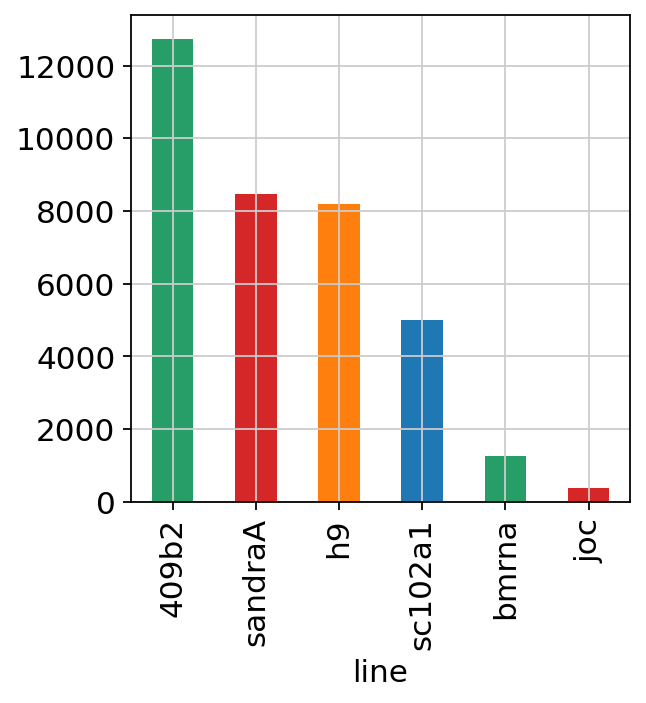

In [14]:
adata.obs['line'].value_counts().plot.bar(color=['#279e68', '#d62728', '#ff7f0e', '#1f77b4']) 

## B. Gestational Week

timepoint
d35      8581
w5       7962
w4       6292
w2       3293
d5       2657
d14      2427
.w4      1724
d35b2    1450
.d5       814
d35b1     459
d35b3     273
d35b4     102
Name: count, dtype: int64

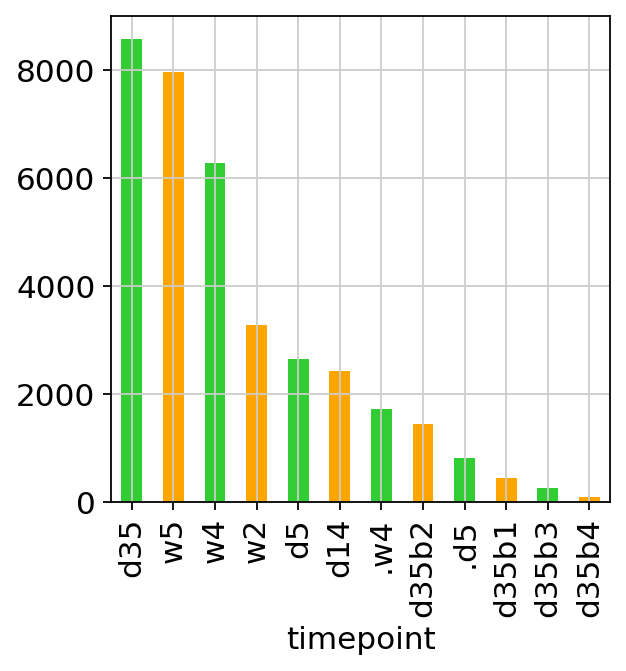

In [15]:
adata.obs['timepoint'].value_counts().plot.bar(color=['limegreen', 'orange'])
adata.obs['timepoint'].value_counts()

## D. Clusters

clusters
C5    7250
C3    6392
C7    5715
C1    5441
C2    5087
C6    3226
C8    2199
C4     724
Name: count, dtype: int64

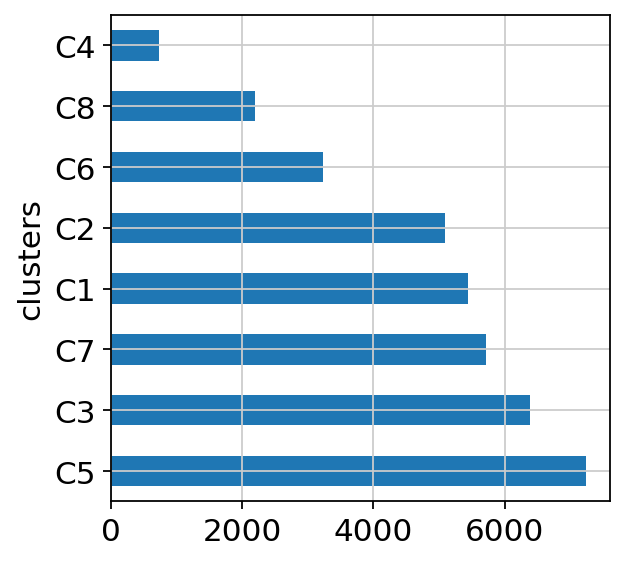

In [16]:
adata.obs['clusters'].value_counts().plot.barh()
adata.obs['clusters'].value_counts()

# 3. Top-expressed genes

The plot shows those genes that yield the highest fraction of counts in each single cells, across all cells.

normalizing counts per cell
    finished (0:00:00)


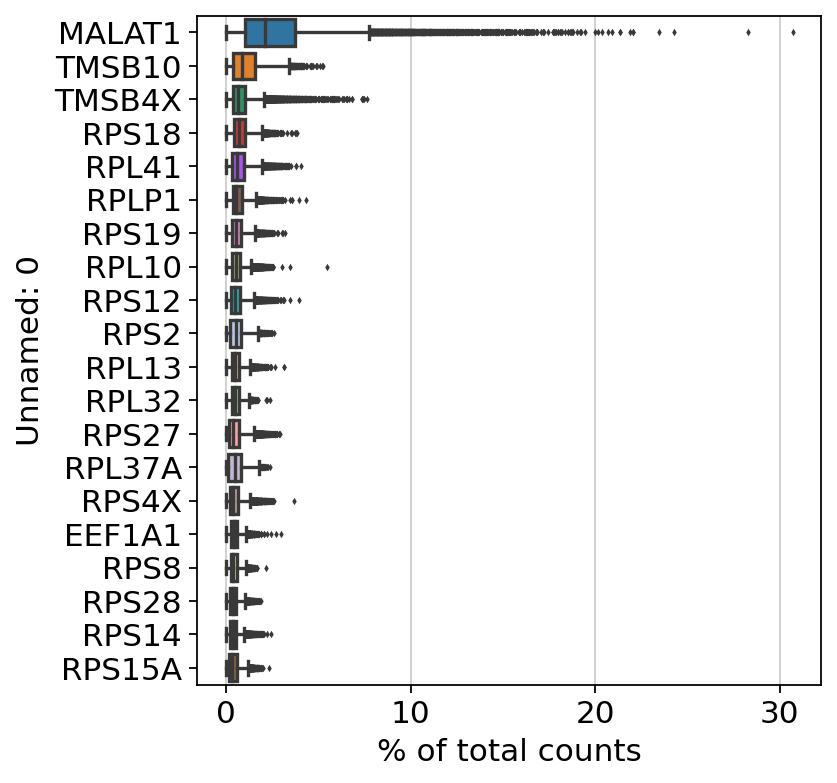

In [17]:
sc.pl.highest_expr_genes(adata, n_top=20)

# 4. Quality Check

Evaluate metrics related to quality as preliminary step for filtering.

    - Mitochondrial gene counts: high proportions are indicative of poor-quality cells, related to loss of cytoplasmic RNA from perforated cells: mitochondrial transcripts are protected by mitochondrial membrane and therefore less likely to escape through tears in the cell membrane.
    - Ribosomal Protein gene counts: high proportion are indicative of a shallow sequencing, because very highly expressed genes occupy most of the reads
    - Number of genes: related to sequencing depth/quality
    - Number of UMI counts for each gene: gene-wise sum of UMI counts (in all the cells)

    NOTE: Thresholds defined below are first showed on diagnostic plots and then applied in the filtering step. You can inspect and change them iteratively until you are satisfied by the results. 

## Gene Filtering

We want to discard genes that are too lowly expressed and thus not informative.

A good approach is to keep genes that are expressed in at least min_cells. We identify this minimum number based on the total number of cells in the dataset, selecting around 0.5% of the total fraction of cells

In [18]:
# Filtering genes on minimum cells: 0.5%
config.QT.MIN_CELLS = np.rint((adata.n_obs * 0.5) / 100)
config.QT.MIN_CELLS

180.0

## 4.1 Identify Mitocondrial and Ribosomal genes

The string based selection is not completely accurate because it can also include genes that are not mitocondrial/ribosomal but share the string used for the selection.

It should be anyway a good enough approximation for our purposes.
NOTE: Metadata already contains mito % etc, we recompute them and check if they are coherent.

In [19]:
#Find mito and ribo genes
mito_genes = adata.var_names.str.startswith('MT-')    
ribo_genes = adata.var_names.str.contains('^RPS|^RPL')

adata.var['mito'] = adata.var_names.str.startswith('MT-')    
adata.var['ribo']= adata.var_names.str.contains('^RPS|^RPL')

adata.var_names[ribo_genes]

Index(['RPL22', 'RPL11', 'RPS6KA1', 'RPS8', 'RPL5', 'RPS27', 'RPS6KC1', 'RPS7',
       'RPS27A', 'RPL31',
       ...
       'RPS5', 'RPL3', 'RPS19BP1', 'RPS4Y1', 'RPS17L', 'RPSAP58', 'RPS4Y2',
       'RPS10P7', 'RPS10-NUDT3', 'RPL3L'],
      dtype='object', name='Unnamed: 0', length=104)

## 4.2 Automated QC metrics

We use the scanpy automated QC metrics function: calculate_qc_metrics in module scanpy.preprocessing._qc. See calculate_qc_metrics docs

In [20]:
sc.pp.calculate_qc_metrics(
    adata, qc_vars=['mito','ribo'], inplace=True,
    log1p=False, percent_top=None)

adata.obs.head()

,timepoint,line,10X_date,clusters,tSNE_1,tSNE_2,sample_id,run_id,cell_label,n_genes_by_counts,total_counts,total_counts_mito,pct_counts_mito,total_counts_ribo,pct_counts_ribo
AAACCTGAGACCTAGG-4.d5_409b2_171212,d5,409b2,171212,C8,-89.187002,19.220198,409b2,NoInfo,C8,4825,40752,426,1.045347,16765,41.139085
AAACCTGAGTCCGTAT-4.d5_409b2_171212,d5,409b2,171212,C5,48.413219,-12.483613,409b2,NoInfo,C5,1873,4353,84,1.929704,788,18.102458
AAACCTGGTATCTGCA-4.d5_409b2_171212,d5,409b2,171212,C5,86.033093,-7.297135,409b2,NoInfo,C5,1375,2981,39,1.308286,550,18.450185
AAACCTGTCATAAAGG-4.d5_409b2_171212,d5,409b2,171212,C8,-99.750682,15.862280,409b2,NoInfo,C8,3216,17103,280,1.637140,7160,41.864000
AAACCTGTCGTTGCCT-4.d5_409b2_171212,d5,409b2,171212,C7,34.884410,62.724772,409b2,NoInfo,C7,2539,8536,182,2.132146,2403,28.151359


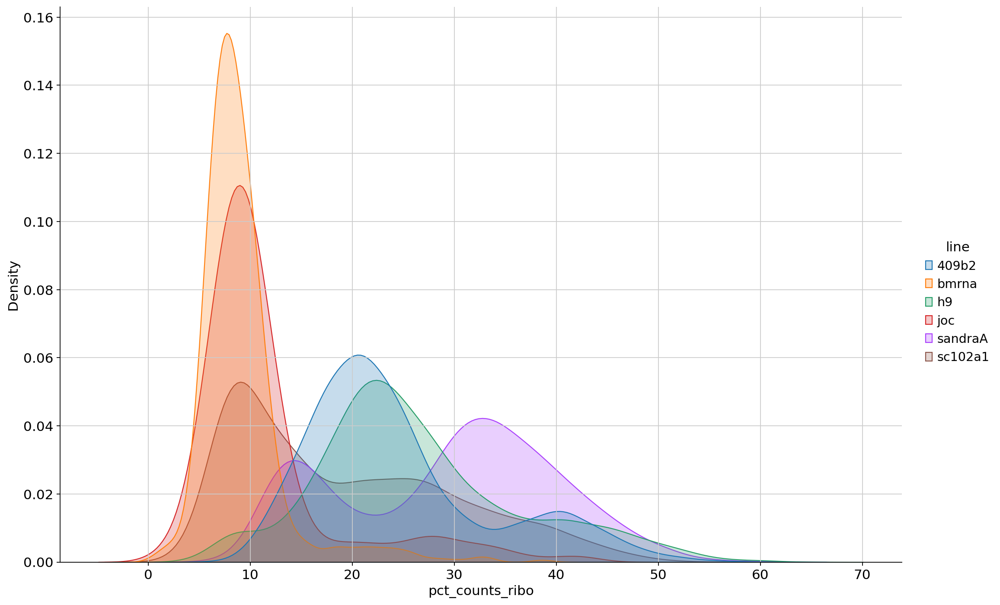

In [28]:
# plt.figure(figsize=(9, 9))
sns.displot(
    adata.obs, x="pct_counts_ribo",
    hue="line", kind="kde", fill=True,
    # stat="density", 
    # log_scale=True,
    common_norm=False,
    height=9, aspect=1.5
)

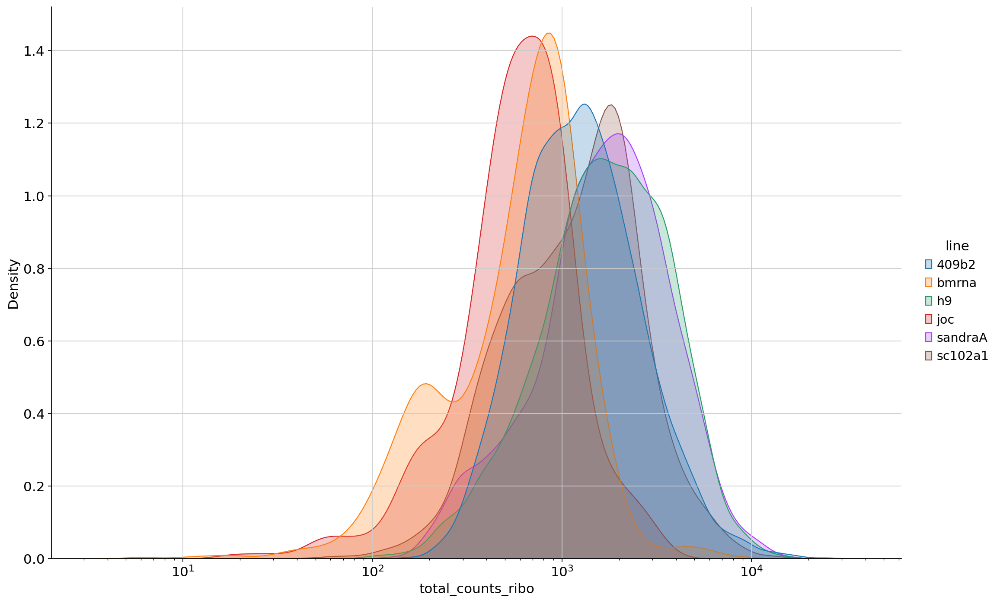

In [29]:
# plt.figure(figsize=(9, 9))
sns.displot(
    adata.obs, x="total_counts_ribo",
    hue="line", kind="kde", fill=True,
    # stat="density",
    log_scale=True,
    common_norm=False,
    height=9, aspect=1.5
)

<Axes: xlabel='tSNE_1', ylabel='tSNE_2'>

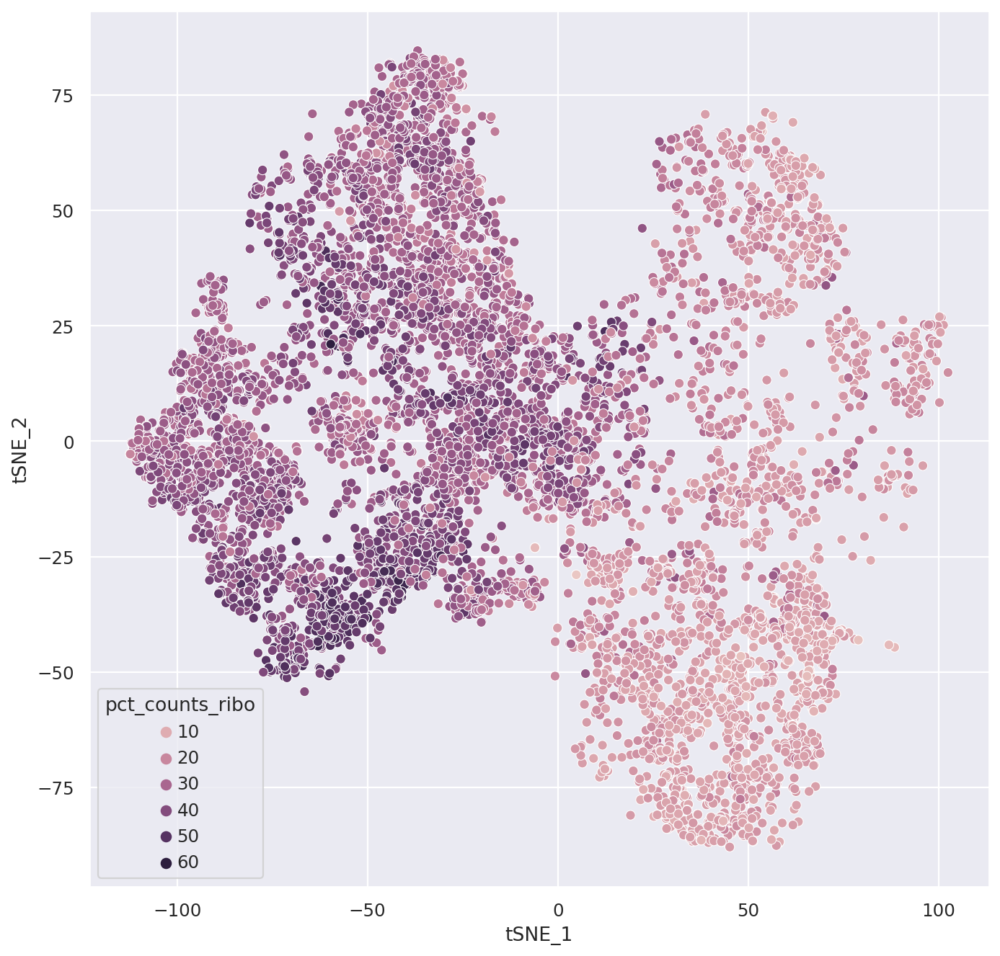

In [43]:
# sns.scatterplot(
#     data=adata.obs[adata.obs.line != 'sandraA'],
#     x="tSNE_1", y="tSNE_2", hue="pct_counts_ribo",
#     legend=None
# )
# plt.show()

sns.set(rc={'figure.figsize':(10,10)})
sns.scatterplot(
    data=adata.obs[adata.obs.line == 'sandraA'],
    x="tSNE_1", y="tSNE_2", hue="pct_counts_ribo",
    hue_norm=(0, 60)
    # legend=None
)

## 4.3 Inspect quality-related parameters

In [44]:
#Print quantiles to get an idea of the value distributions
print(np.quantile(adata.obs['pct_counts_mito'], np.arange(0, 1.1, 0.1))) 

[0.         0.66658335 0.91944141 1.15331733 1.38258447 1.62408283
 1.8916732  2.20419118 2.63035657 3.32522244 4.99932259]


Mitochondrial genes

In [45]:
print(np.quantile(adata.obs['pct_counts_ribo'], np.arange(0, 1.1, 0.1)))

[ 0.70339977 10.9699384  15.10700791 18.1887812  20.76868286 23.24622314
 26.09111942 29.79788125 34.55109264 40.42808566 65.12353082]


Ribosomal Protein genes

In [46]:
print(np.quantile(adata.obs['total_counts'], np.arange(0, 1.1, 0.1)))

[  611.   2547.   3378.   4220.   5130.2  6141.   7264.   8790.1 10962.
 14880.4 57352. ]


Total number of counts for each cell

In [47]:
print(np.quantile(adata.obs['n_genes_by_counts'], np.arange(0, 1.1, 0.1)))

[ 501. 1174. 1453. 1723. 1986. 2273. 2577. 2947. 3415. 4127. 5997.]


Number of genes detected in each cell

## 4.4 Visualization
Violin plots: linear values

In [48]:
warnings.filterwarnings("ignore")

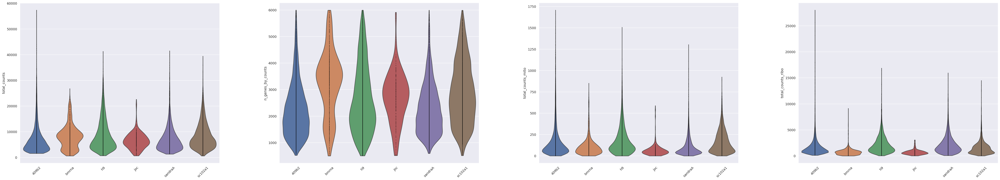

In [49]:
sc.pl.violin(adata, keys=['total_counts', 'n_genes_by_counts', 'total_counts_mito', 'total_counts_ribo'],
             jitter=False, multi_panel=True, groupby='line', rotation=45)

Violin plots: log values

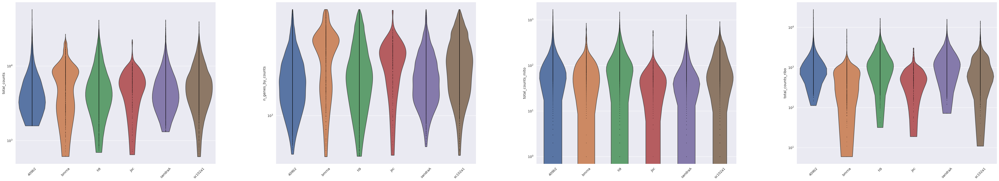

In [50]:
sc.pl.violin(adata, keys=['total_counts', 'n_genes_by_counts', 'total_counts_mito', 'total_counts_ribo'],
             jitter=False, multi_panel=True, log=True, groupby='line', rotation=45)

Density plots  

Single Plots

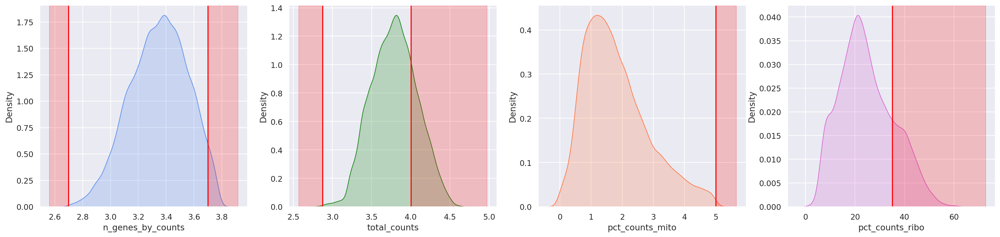

In [51]:
vs.densityQCs(adata)

Double Plots

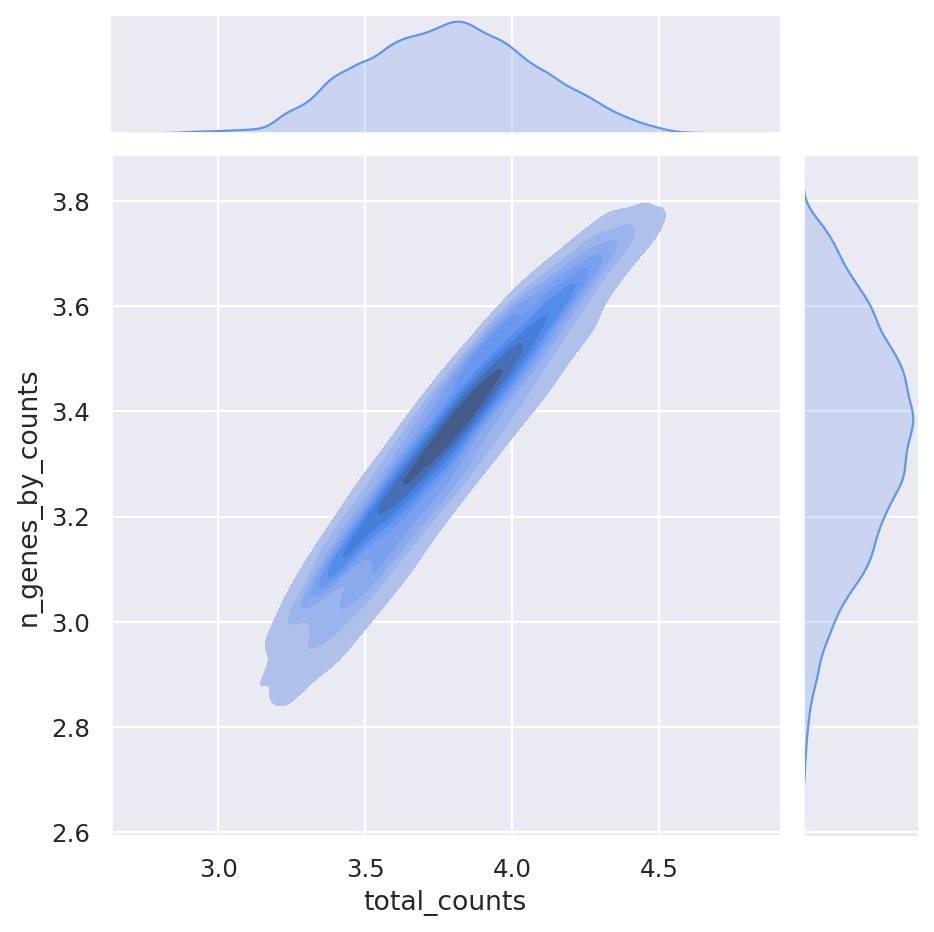

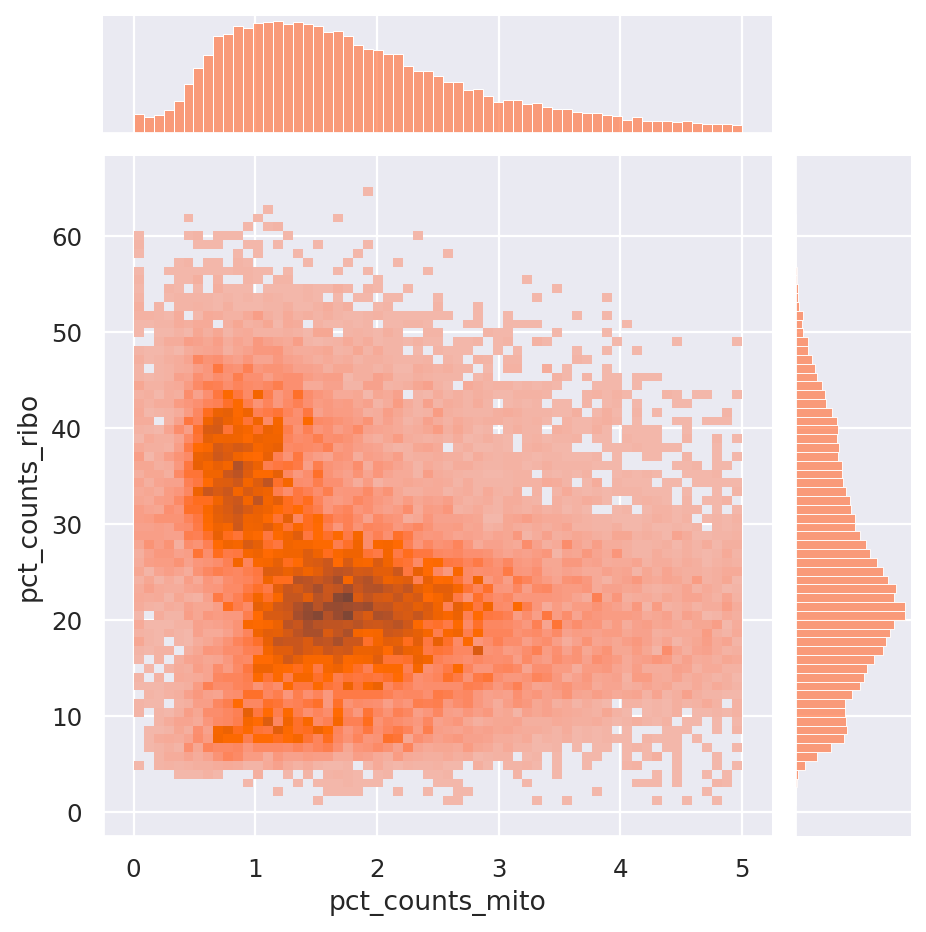

In [53]:
sns.jointplot(x=np.log10(adata.obs['total_counts']), 
              y=np.log10(adata.obs['n_genes_by_counts']), 
              kind="kde", color="cornflowerblue", fill=True)
plt.show()
sns.jointplot(x=adata.obs['pct_counts_mito'], 
              y=adata.obs['pct_counts_ribo'], 
              kind="hist", color="coral")

In [54]:
import scrublet as scr
scrub = scr.Scrublet(adata.X)
doublet_scores, predicted_doublets = scrub.scrub_doublets()
adata.obs['QC_doublets'] = doublet_scores

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.56
Detected doublet rate = 0.2%
Estimated detectable doublet fraction = 34.3%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 0.5%
Elapsed time: 62.4 seconds


<Axes: xlabel='tSNE_1', ylabel='tSNE_2'>

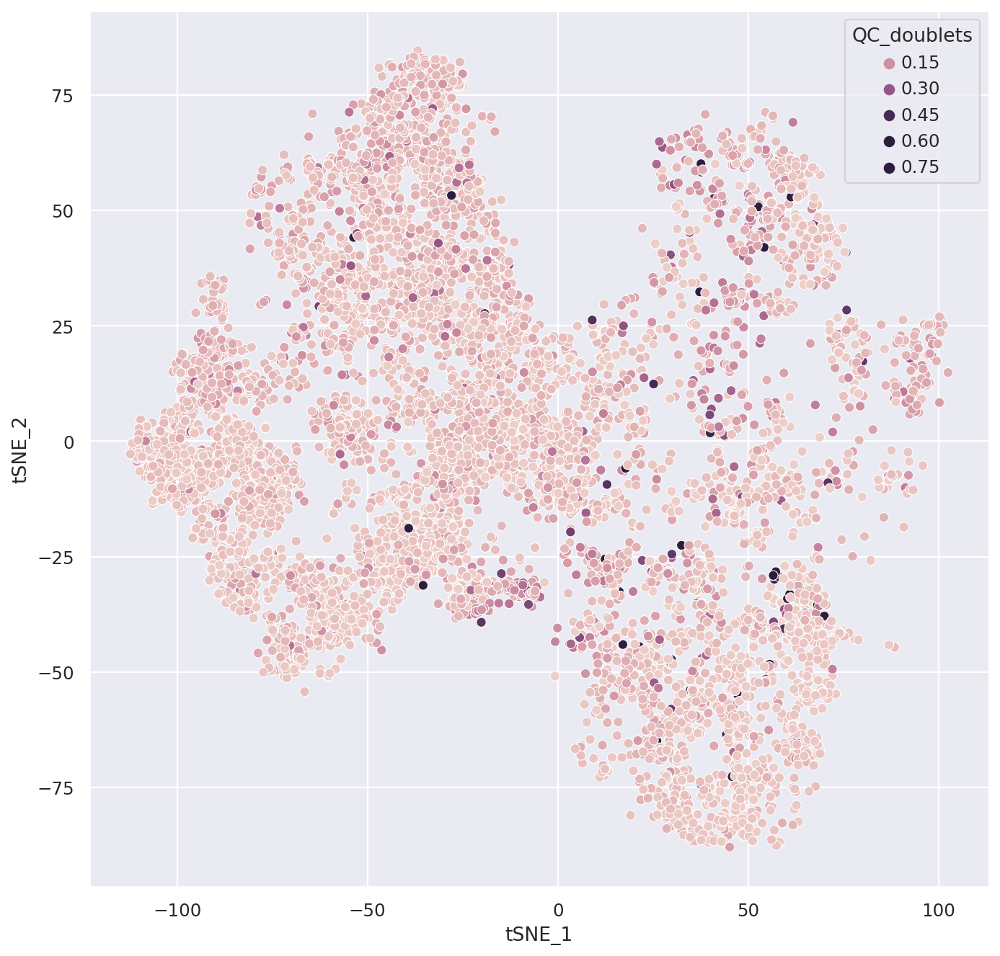

In [59]:
sns.scatterplot(
    data=adata.obs[adata.obs.line == 'sandraA'],
    x="tSNE_1", y="tSNE_2", hue="QC_doublets",
    hue_norm=(0, .5)
    #, legend=None
)

<Axes: xlabel='tSNE_1', ylabel='tSNE_2'>

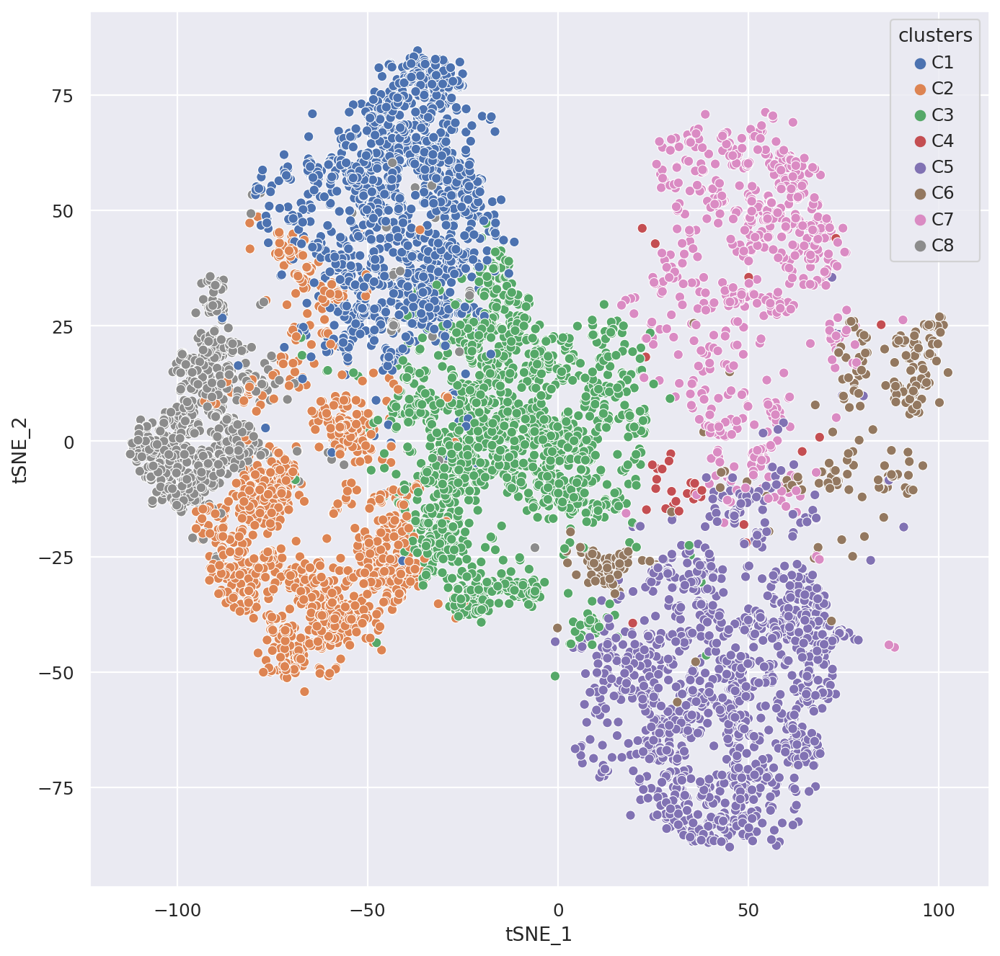

In [62]:
sns.scatterplot(
    data=adata.obs[adata.obs.line == 'sandraA'],
    x="tSNE_1", y="tSNE_2", hue="clusters",

    #, legend=None
)

<Axes: xlabel='tSNE_1', ylabel='tSNE_2'>

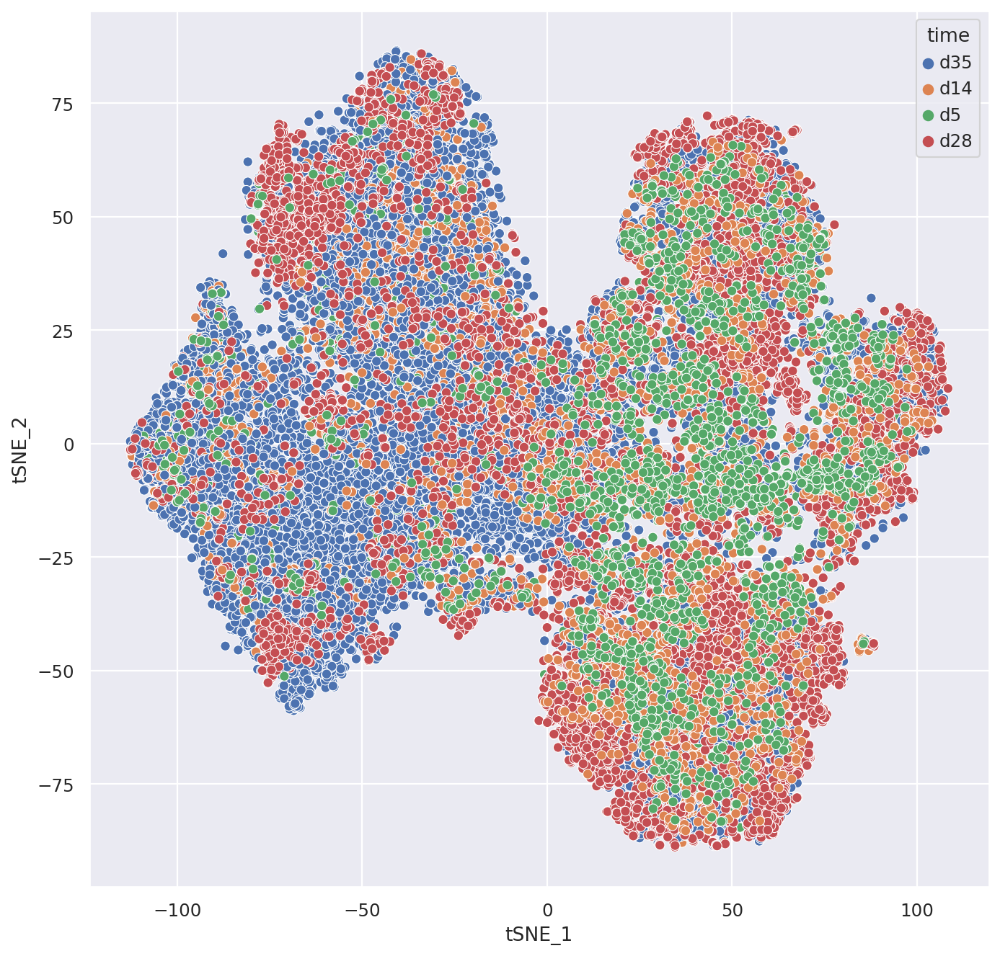

In [102]:
adata.obs['time'] = adata.obs.timepoint.apply(lambda x: 'd{}'.format(config.TIMEPOINT_MAP[x]))
sns.scatterplot(
    data=adata.obs[::-1],
    x="tSNE_1", y="tSNE_2", hue="time",
)

<Axes: xlabel='tSNE_1', ylabel='tSNE_2'>

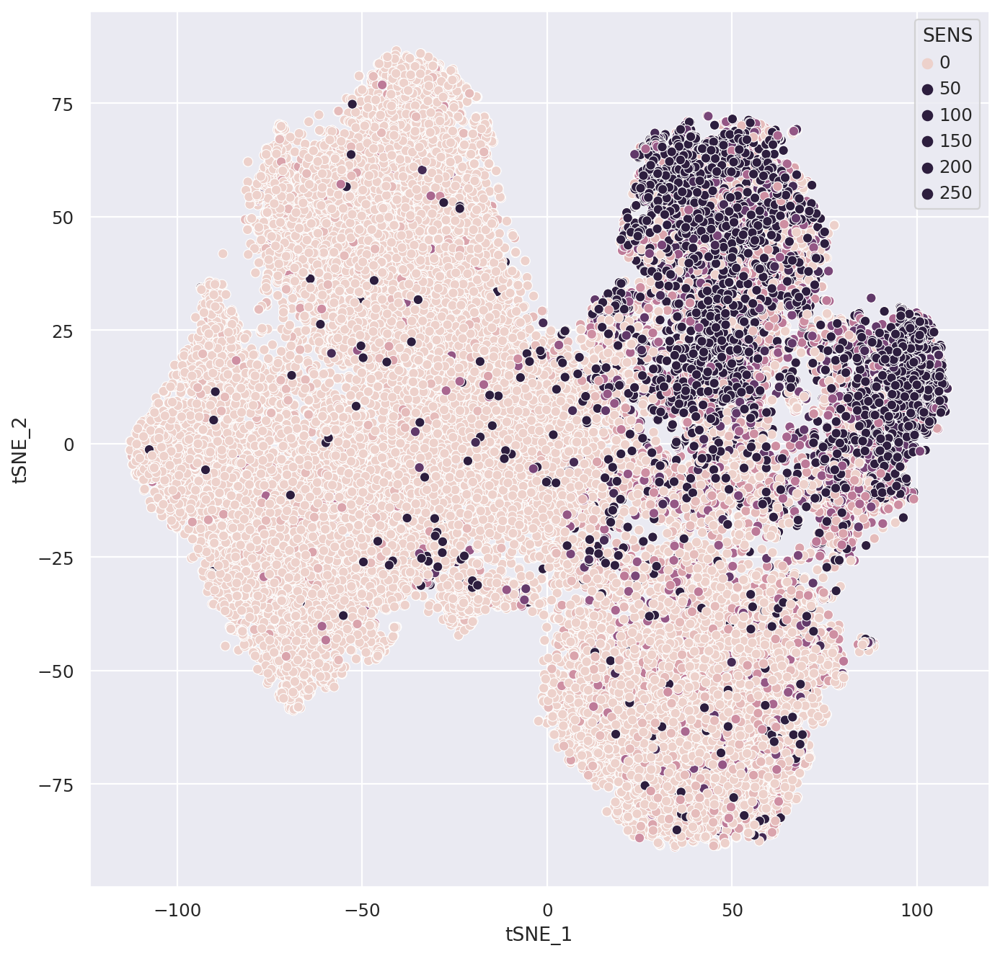

In [110]:
SENS = adata.X[:, np.where(adata.var.index == 'PRPH')[0]]
adata.obs['SENS'] = PRPH.toarray()[:, 0]
SENS = adata.X[:, np.where(adata.var.index == 'NTRK2')[0]]
adata.obs['SENS'] += PRPH.toarray()[:, 0]
sns.scatterplot(
    data=adata.obs,
    x="tSNE_1", y="tSNE_2", hue="SENS",
    hue_norm=(0, 20)
)

# 5. Filtering

Modify the threshold variables cell at the start of the QC to overwrite the default filtering values


In [65]:
print(
    '\nThe selected filtering parameters are: \n Minimum cells: ', config.QT.MIN_CELLS, 
    '\n Minimum counts: ' , config.QT.MIN_COUNTS, 
    '\n Maximum counts:' , config.QT.MAX_COUNTS,
    '\n Minimum genes: ' , config.QT.MIN_GENES, 
    '\n Maximum genes:' , config.QT.MAX_GENES,
    '\n Mitocondia: ' , config.QT.MT_PERCENTAGE, 
    '%', '\n Ribosomal: ', config.QT.RB_PERCENTAGE, '%')


The selected filtering parameters are: 
 Minimum cells:  180.0 
 Minimum counts:  750 
 Maximum counts: 10000 
 Minimum genes:  500 
 Maximum genes: 5000 
 Mitocondia:  5 % 
 Ribosomal:  35 %


## 5.1 Filtering Cells

In [41]:
# Detected Genes
sc.pp.filter_cells(adata, min_genes=config.QT.MIN_GENES)
print('After filtering on min detected genes:number of cells:', adata.n_obs)
print()

# UMI Counts
sc.pp.filter_cells(adata, min_counts = config.QT.MIN_COUNTS)
print('After filtering on min UMI counts:number of cells:', adata.n_obs)

# Mitochondrial RNA

#adata.obs[adata.obs['percent_mito'] > 0.05]  
adata = adata[adata.obs['pct_counts_mito'] < config.QT.MT_PERCENTAGE, :]
print('After filtering on mitochondrial RNA: number of cells:', adata.n_obs)

# Ribosomal RNA

#adata = adata[adata.obs['percent_ribo'] < 0.35, :]
adata = adata[adata.obs['pct_counts_ribo'] < config.QT.RB_PERCENTAGE, :]
print('After filtering on ribosomal protein RNA: number of cells:', adata.n_obs)


After filtering on min detected genes:number of cells: 36034

filtered out 14 cells that have less than 750 counts
After filtering on min UMI counts:number of cells: 36020
After filtering on mitochondrial RNA: number of cells: 36020
After filtering on ribosomal protein RNA: number of cells: 29100


In [52]:
# Detected Genes
sc.pp.filter_cells(adata, min_genes=MIN_GENES)
print('After filtering on min detected genes:number of cells:', adata.n_obs)
print()

# UMI Counts
sc.pp.filter_cells(adata, min_counts=MIN_COUNTS)
print('After filtering on min UMI counts:number of cells:', adata.n_obs)

# Mitochondrial RNA

#adata.obs[adata.obs['percent_mito'] > 0.05]  
adata = adata[adata.obs['pct_counts_mito'] < MT_PERCENTAGE, :]
print('After filtering on mitochondrial RNA: number of cells:', adata.n_obs)

# Ribosomal RNA

#adata = adata[adata.obs['percent_ribo'] < 0.35, :]
adata = adata[adata.obs['pct_counts_ribo'] < RB_PERCENTAGE, :]
print('After filtering on ribosomal protein RNA: number of cells:', adata.n_obs)


After filtering on min detected genes:number of cells: 28575

filtered out 893 cells that have less than 750 counts
After filtering on min UMI counts:number of cells: 27682
After filtering on mitochondrial RNA: number of cells: 27681
After filtering on ribosomal protein RNA: number of cells: 27457


## 5.2 Filtering genes

Filtered out genes expressed in less than 0.5% of cells

In [46]:
print('Before gene filtering: number of genes:', adata.n_vars)
print('Before gene filtering: number of cells:', adata.n_obs)

print(config.QT.MIN_CELLS) # Filtering genes on minimum cells: 1%
sc.pp.filter_genes(adata, min_cells=config.QT.MIN_CELLS)

print('After gene filtering: number of genes:', adata.n_vars)
print('After filtering: number of cells:', adata.n_obs)

Before gene filtering: number of genes: 15629
Before gene filtering: number of cells: 29100
180
After gene filtering: number of genes: 15629
After filtering: number of cells: 29100


## 5.3 Numbers after filtering

After applied filtering: number of cells: 36034
After applied filtering: number of genes: 23454


<Axes: xlabel='line'>

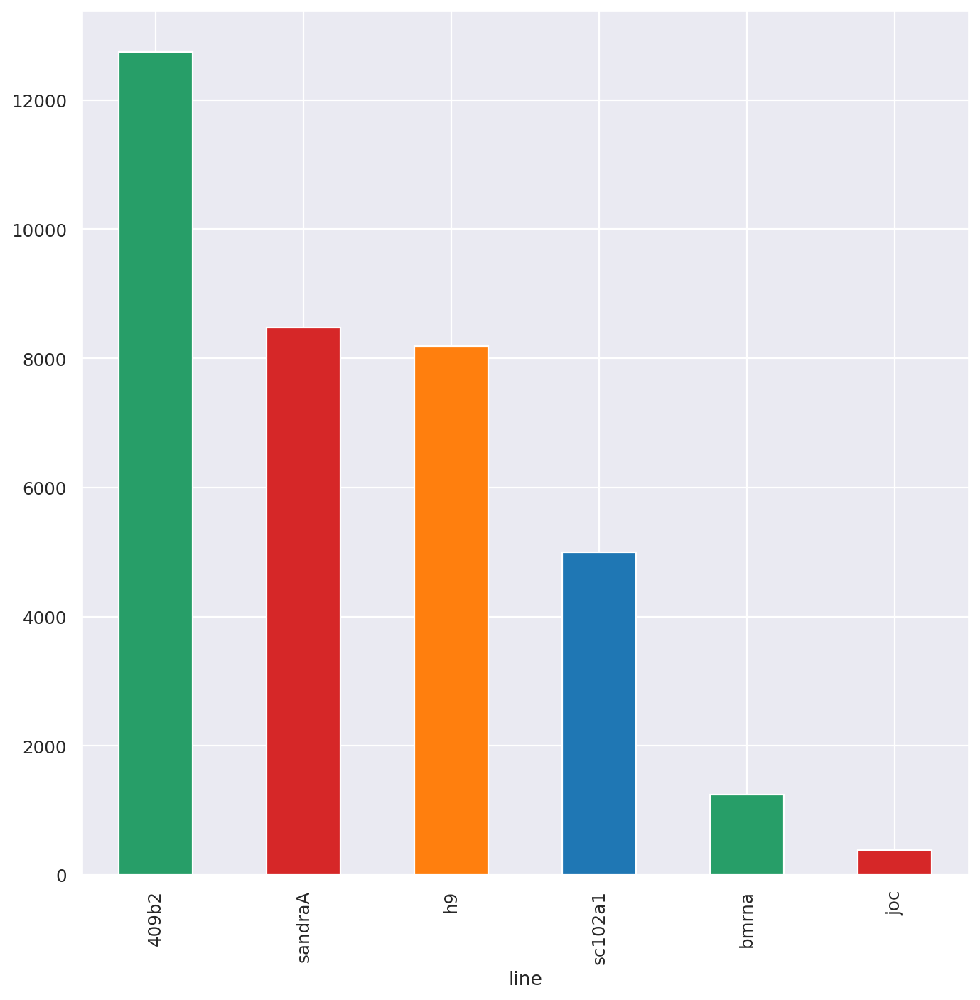

In [66]:
print('After applied filtering: number of cells:', adata.n_obs)
print('After applied filtering: number of genes:', adata.n_vars)

adata.obs['line'].value_counts().plot.bar(color=['#279e68', '#d62728', '#ff7f0e', '#1f77b4'])

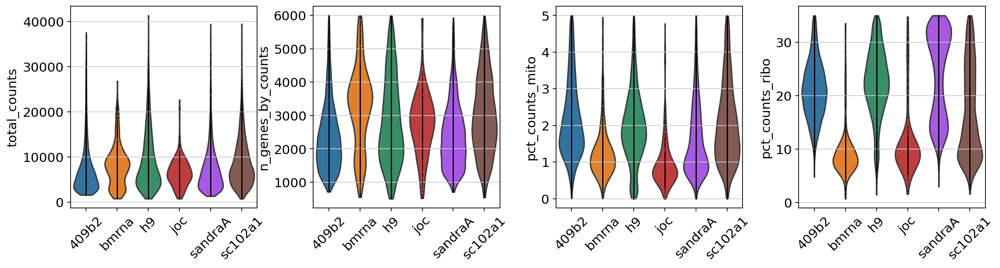

In [48]:
sc.pl.violin(
    adata, keys=['total_counts', 'n_genes_by_counts', 'pct_counts_mito', 'pct_counts_ribo'],
    groupby='line', jitter=False, multi_panel=True, rotation=45)


# 6. Save file
## 6.1 Save Adata

In [67]:
import scipy

In [68]:
type(adata.X)

scipy.sparse._csr.csr_matrix
adata.X

<36034x23454 sparse matrix of type '<class 'numpy.int64'>'
	with 89179705 stored elements in Compressed Sparse Row format>

In [69]:
#Check that adata.X is stored as sparse if not convert if (isspmatrix(adata.X) == False): adata.X = csr_matrix(adata.X) print("Converted adata.X to sparse")
adata.write(results_file)

## 6.2 Finished computations: timestamp

In [52]:
print(datetime.now())

2023-08-06 20:38:50.105501
